<a href="https://colab.research.google.com/github/CCMunozB/Computacion2/blob/master/4-deep-learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning

**Disclaimer**: This notebook was tested in Google Colab https://colab.research.google.com/
Programmed by Cristian Muñoz.

For this notebook the data from https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5 was used. Also the code from https://www.kaggle.com/sanwal092/intro-to-cnn-using-keras-to-predict-pneumonia

## Setup

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import datetime
from PIL import Image
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from sklearn.metrics import classification_report, confusion_matrix, classification_report

In [ ]:
%load_ext tensorboard

In collab you can use GPUs!

In [ ]:
tf.test.gpu_device_name() # check Tensorflow is using GPU

'/device:GPU:0'

In [ ]:
# get the data
!wget --no-check-certificate "http://sasiba.uchile.cl/index.php/s/JjgCtWLjDPOdun3/download" -O chest_xray.rar

--2024-08-21 03:58:12--  http://sasiba.uchile.cl/index.php/s/JjgCtWLjDPOdun3/download
Resolving sasiba.uchile.cl (sasiba.uchile.cl)... 200.89.79.35
Connecting to sasiba.uchile.cl (sasiba.uchile.cl)|200.89.79.35|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://sasiba.uchile.cl/index.php/s/JjgCtWLjDPOdun3/download [following]
--2024-08-21 03:58:13--  https://sasiba.uchile.cl/index.php/s/JjgCtWLjDPOdun3/download
Connecting to sasiba.uchile.cl (sasiba.uchile.cl)|200.89.79.35|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 1125340057 (1.0G) [application/x-rar-compressed]
Saving to: ‘chest_xray.rar’

chest_xray.rar      100%[===================>]   1.05G  25.1MB/s    in 44s     

2024-08-21 03:58:57 (24.4 MB/s) - ‘chest_xray.rar’ saved [1125340057/1125340057]



In [ ]:
%%capture
# uncompress dataset
!unrar x chest_xray.rar

## Preprocessing

In [ ]:
# Configuramos las rutas de los datos
train_folder= 'chest_xray/train/'
val_folder = 'chest_xray/val/'
test_folder = 'chest_xray/test/'
train_n = train_folder+'NORMAL/'
train_p = train_folder+'PNEUMONIA/'

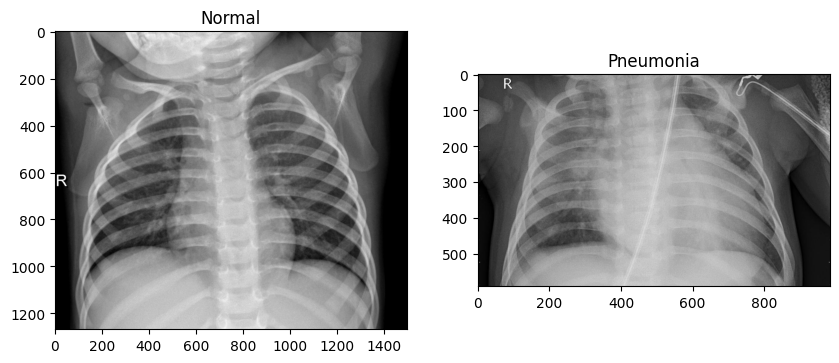

In [ ]:
# Look to a some example images

rand_norm= np.random.randint(0,len(os.listdir(train_n)))
norm_pic = os.listdir(train_n)[rand_norm]

norm_pic_address = train_n+norm_pic

rand_p = np.random.randint(0,len(os.listdir(train_p)))

sic_pic =  os.listdir(train_p)[rand_norm]
sic_address = train_p+sic_pic

norm_load = Image.open(norm_pic_address)
sic_load = Image.open(sic_address)

f = plt.figure(figsize= (10,6))
a1 = f.add_subplot(1,2,1)
img_plot = plt.imshow(norm_load, cmap="gray")
a1.set_title('Normal')

a2 = f.add_subplot(1, 2, 2)
img_plot = plt.imshow(sic_load, cmap="gray")
a2.set_title('Pneumonia')

plt.show()

In [ ]:
# Configure dataset we are going to use (with data augmentation)

batch_size = 32

# data augmentation
train_datagen = ImageDataGenerator(rescale = 1./255, # normalize images
                                   shear_range = 0.2, # image distortion
                                   zoom_range = 0.2, # zoom in distortion
                                   horizontal_flip = True) # image flip

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory(train_folder,
                                                 target_size = (64, 64), # re-scale to 64*64
                                                 batch_size = batch_size,
                                                 class_mode = 'binary',
                                                 color_mode="grayscale") # only brightness channel

val_set = test_datagen.flow_from_directory(val_folder,
                                            target_size=(64, 64),
                                            batch_size=batch_size,
                                            class_mode='binary',
                                            shuffle = False,
                                            color_mode="grayscale")

test_set = test_datagen.flow_from_directory(test_folder,
                                            target_size = (64, 64),
                                            batch_size = batch_size,
                                            class_mode = 'binary',
                                            shuffle = False,
                                            color_mode="grayscale")

Found 4186 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


## Model

In [ ]:
# Build neural network architecture

cnn = Sequential()

cnn.add(Conv2D(32, (3, 3), activation="relu", input_shape=(64, 64, 1))) # Convolutional Layer

cnn.add(MaxPooling2D(pool_size = (2, 2)))

cnn.add(Conv2D(32, (3, 3), activation="relu"))

cnn.add(MaxPooling2D(pool_size = (2, 2)))

cnn.add(Flatten())

cnn.add(Dense(activation = 'relu', units = 128))
cnn.add(Dense(activation = 'sigmoid', units = 1))

cnn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy']) # Creamos la arquitectura

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Verify architecture

cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 62, 62, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 31, 31, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 29, 29, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         802,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 812,641 (3.10 MB)

 Trainable params: 812,641 (3.10 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [ ]:
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Traing neural network

cnn_history = cnn.fit(training_set,
                         epochs = 10, # Trainning for 10 epochs
                         validation_data = val_set,
                         callbacks=[tensorboard_callback])

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


131/131 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - accuracy: 0.6513 - loss: 0.6290 - val_accuracy: 0.8125 - val_loss: 0.5640
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 34s 205ms/step - accuracy: 0.8585 - loss: 0.3770 - val_accuracy: 0.5625 - val_loss: 0.6847
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8768 - loss: 0.3497 - val_accuracy: 0.7500 - val_loss: 0.6041
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 29s 208ms/step - accuracy: 0.9006 - loss: 0.3054 - val_accuracy: 0.6250 - val_loss: 0.7072
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 29s 209ms/step - accuracy: 0.8951 - loss: 0.3110 - val_accuracy: 0.8125 - val_loss: 0.5535
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.9063 - loss: 0.2292 - val_accuracy: 0.8750 - val_loss: 0.3485
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.9137 - loss: 0.2126 - val_accuracy: 0.7500 - val_loss: 0.5044
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 43s 213ms/step - accuracy: 0.9111 - loss: 0.2183 - val

In [ ]:
predictions = cnn.predict(test_set, verbose = 1) > 0.5 # predict over the test test

20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step


In [ ]:
confusion_matrix(test_set.classes, predictions) # confusion matrix

array([[182,  52],
       [ 10, 380]])

In [ ]:
print(classification_report(test_set.classes, predictions)) # performace summary

              precision    recall  f1-score   support

           0       0.95      0.78      0.85       234
           1       0.88      0.97      0.92       390

    accuracy                           0.90       624
   macro avg       0.91      0.88      0.89       624
weighted avg       0.91      0.90      0.90       624



### Exercise 1

**Modifica la arquitectura agregando una nueva capa de convolución y max-pooling prueba si mejoran las métricas**


## Explore!

We can visualiza the activation of each layer

In [ ]:
def image_loader(path):
  image_location = path # test image
  img =Image.open(image_location)
  # load image
  img_resized = tf.keras.preprocessing.image.load_img(
      image_location,
      target_size = (64, 64), # fix dimension
      color_mode="grayscale"
  )
  # from image to array
  img_array = tf.keras.preprocessing.image.img_to_array(
      img_resized
  )
  img_array = np.expand_dims(
      img_array,
      axis=0
  )
  return img, img_resized, img_array

def get_activations(model,img_array):
  # create a model that deliver results at each layer
  layer_outputs = [layer.output for layer in model.layers]
  layer_names = [layer.name for layer in model.layers]
  activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer_outputs)
  activations = activation_model.predict(img_array)
  activations = list(zip(layer_names,activations))
  return activations

# plot results
def plot_conv_layer_result(activations,j):
  fig, axs = plt.subplots(
      nrows=4,
      ncols=8,
      figsize=(15,8)
  )
  fig.suptitle(activations[j][0])
  for i,ax in enumerate(axs.ravel()):
      ax.imshow(activations[j][1][0,:,:,i], cmap="viridis")
      ax.axis("off")
  plt.show()

# plot unidimentional results
def plot_1d_layer_result(activations,j):
  values = activations[j][1][0,:]
  plt.bar(
      range(len(values)),
      values
  )
  plt.title(activations[j][0])
  plt.show()

### Pneumonia

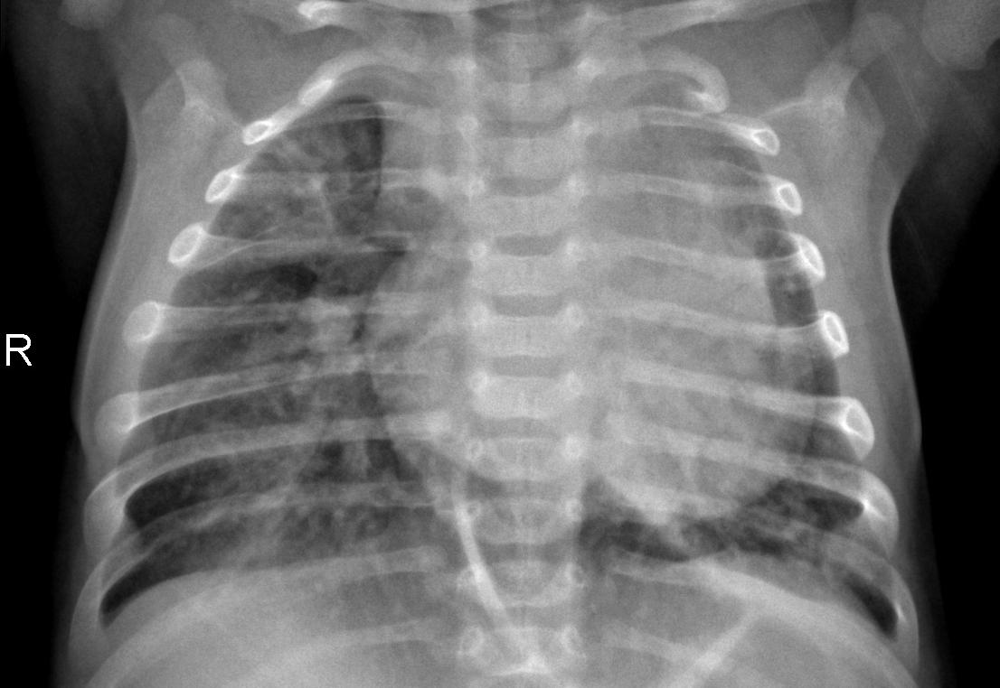

In [ ]:
pneumonia_img, pneumonia_img_resized, pneumonia_img_array = image_loader("chest_xray/test/PNEUMONIA/person100_bacteria_475.jpeg")
pneumonia_img # Original image

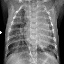

In [ ]:
pneumonia_img_resized # resize image

In [ ]:
pneumonia_img_array.shape # dimension for the network

(1, 64, 64, 1)

In [ ]:
# Prediction from trainned model
cnn.predict(pneumonia_img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


array([[1.]], dtype=float32)

In [ ]:
pneumonia_activations = get_activations(cnn,pneumonia_img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step


In the next 32 images we can see the output of each filter in the convolutional layer.

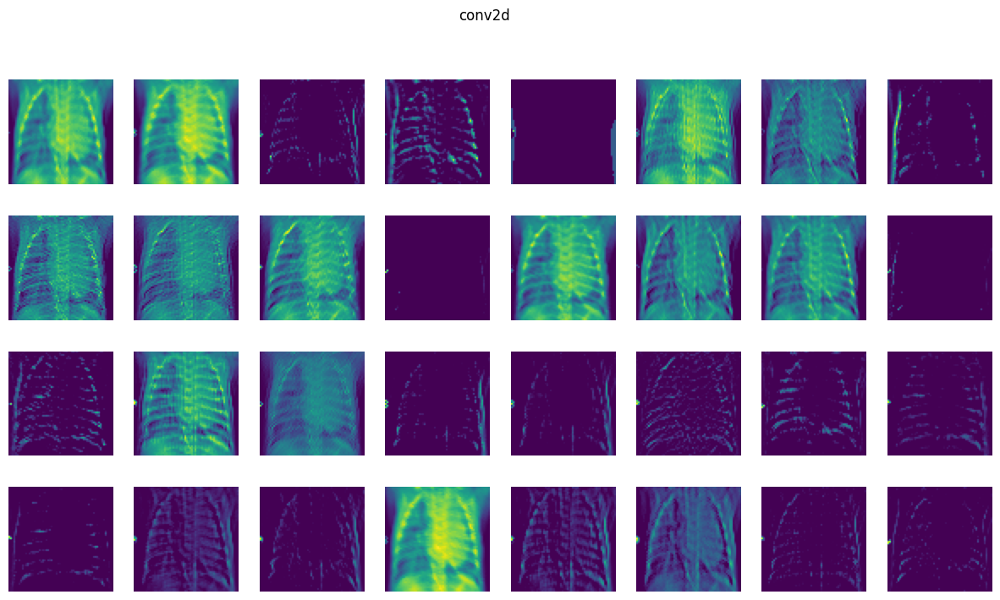

In [ ]:
plot_conv_layer_result(pneumonia_activations,0)

Now we look at the max pool layer (reduce dimention).

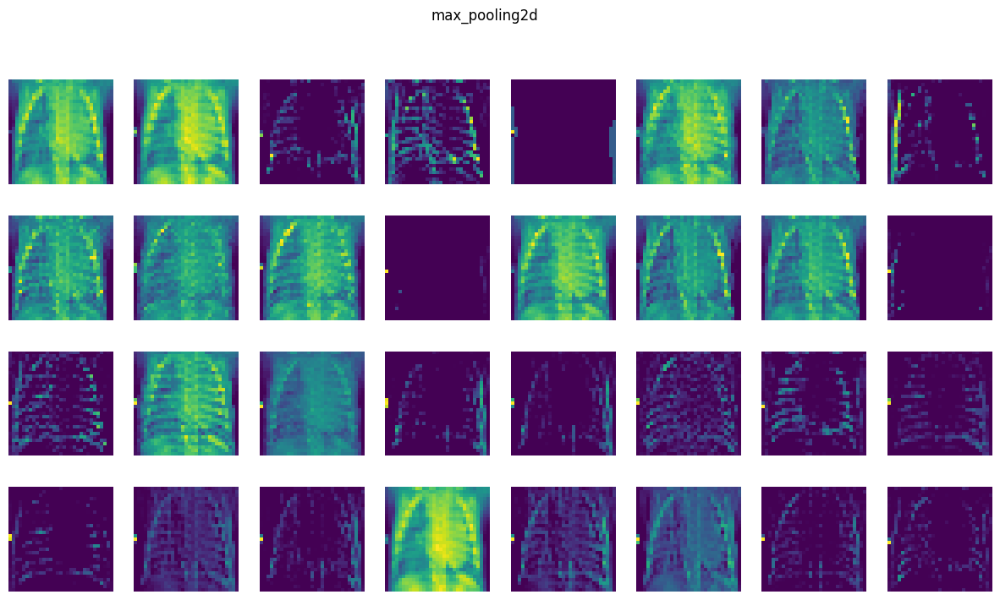

In [ ]:
plot_conv_layer_result(pneumonia_activations,1)

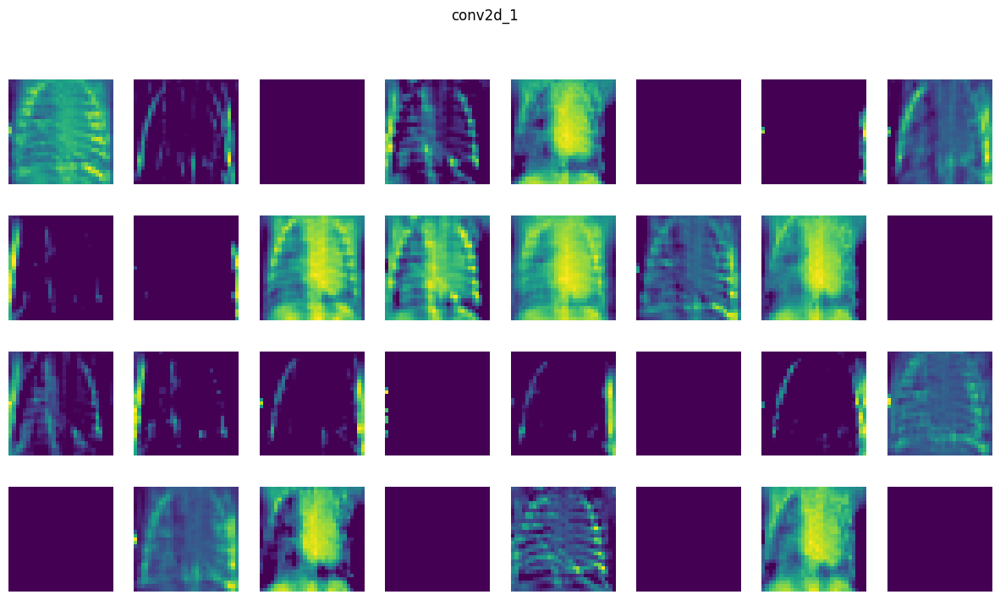

In [ ]:
plot_conv_layer_result(pneumonia_activations,2)

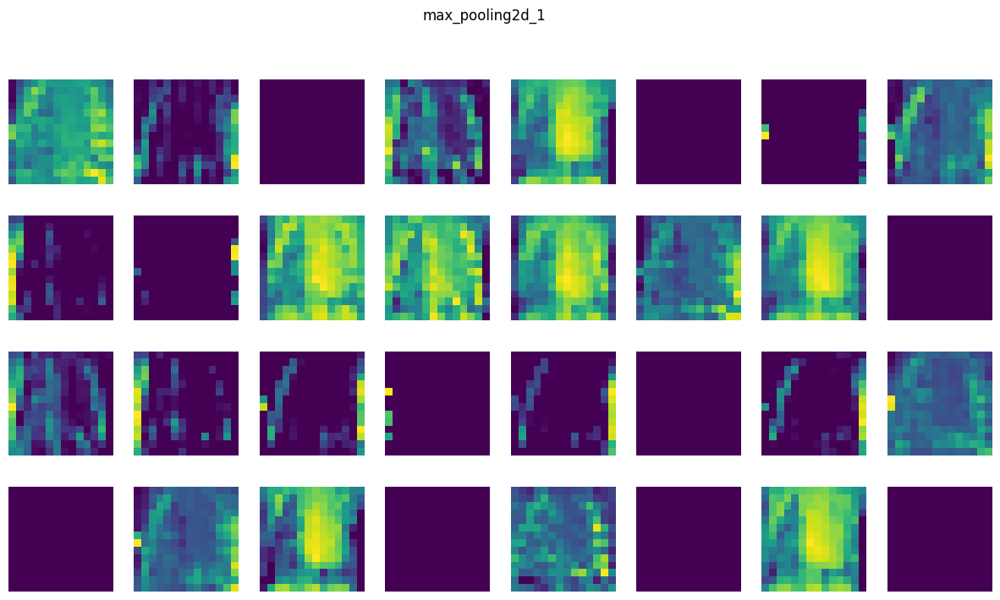

In [ ]:
plot_conv_layer_result(pneumonia_activations,3)

After second max-pooling we only have 1 dimentiona arrays.

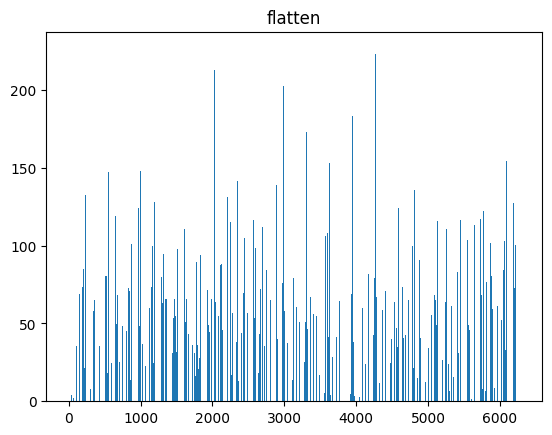

In [ ]:
plot_1d_layer_result(pneumonia_activations,4)

Next layer!

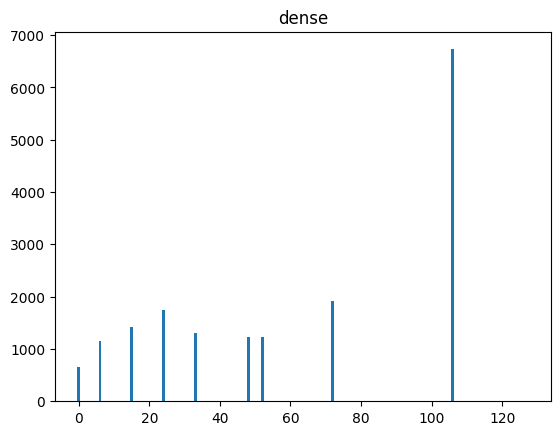

In [ ]:
plot_1d_layer_result(pneumonia_activations,5)

Last layer is 1 neuron correspoing to the classification of the network.

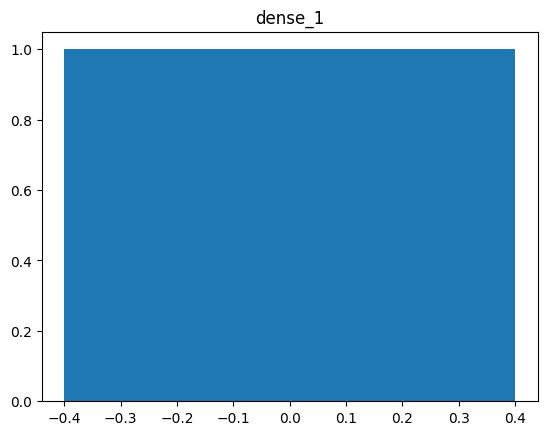

In [ ]:
plot_1d_layer_result(pneumonia_activations,6)

### Normal case

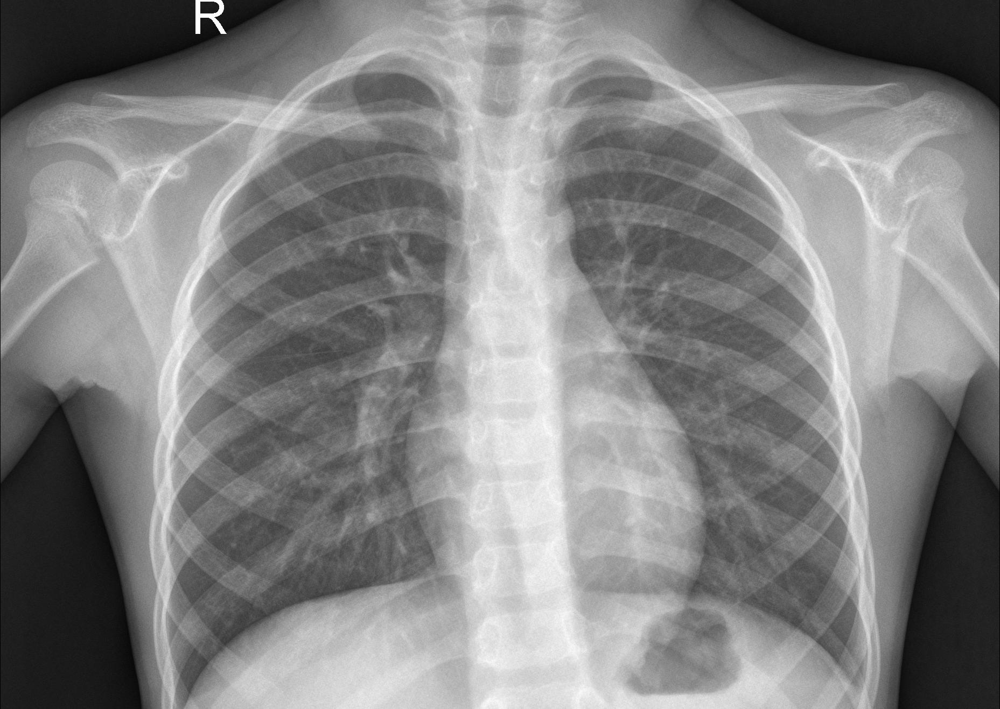

In [ ]:
normal_img, normal_img_resized, normal_img_array = image_loader("chest_xray/test/NORMAL/IM-0001-0001.jpeg")
normal_img

In [ ]:
cnn.predict(normal_img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


array([[0.]], dtype=float32)

In [ ]:
normal_activations = get_activations(cnn,normal_img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step


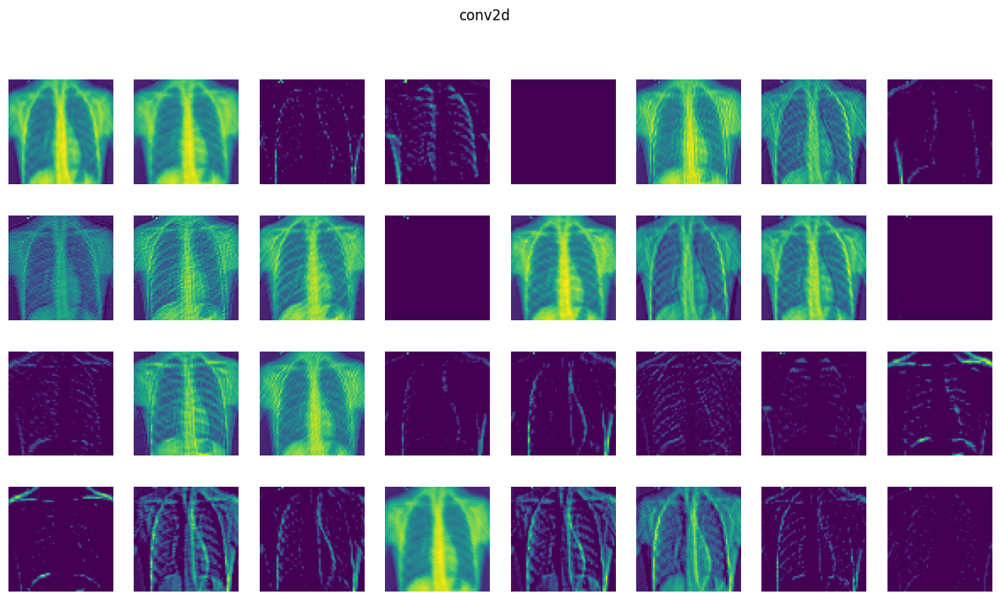

In [ ]:
plot_conv_layer_result(normal_activations,0)

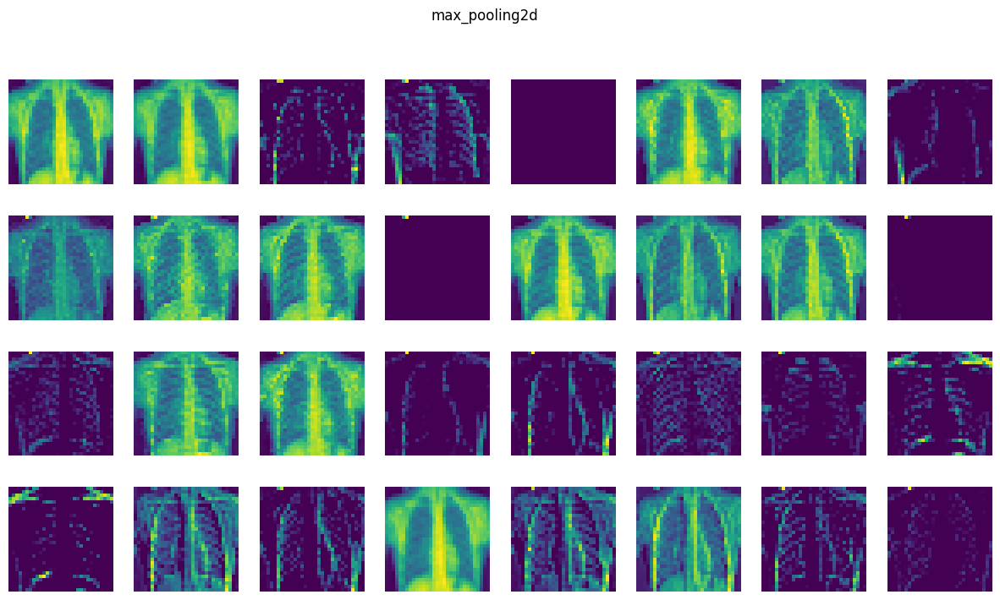

In [ ]:
plot_conv_layer_result(normal_activations,1)

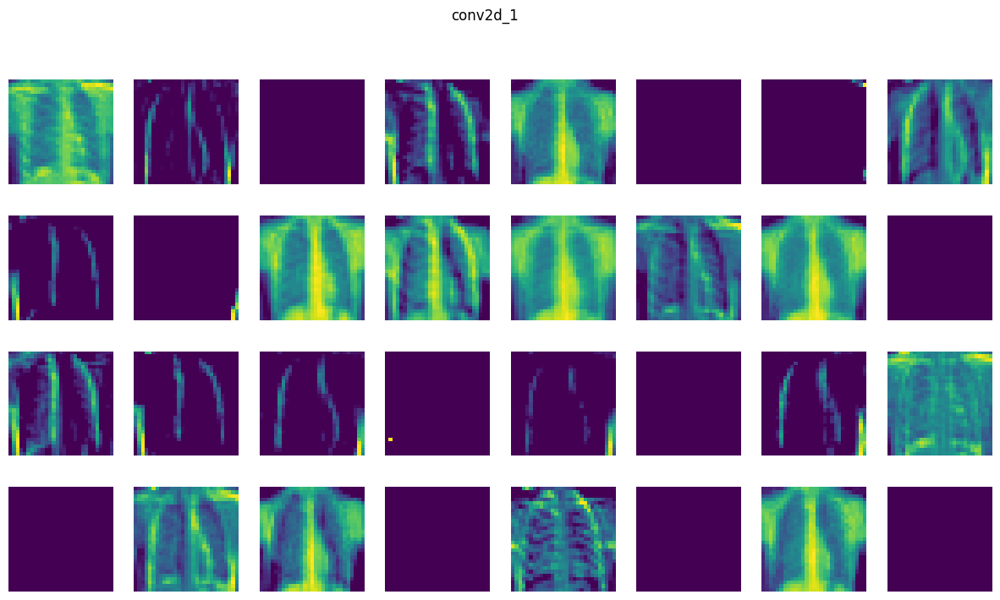

In [ ]:
plot_conv_layer_result(normal_activations,2)

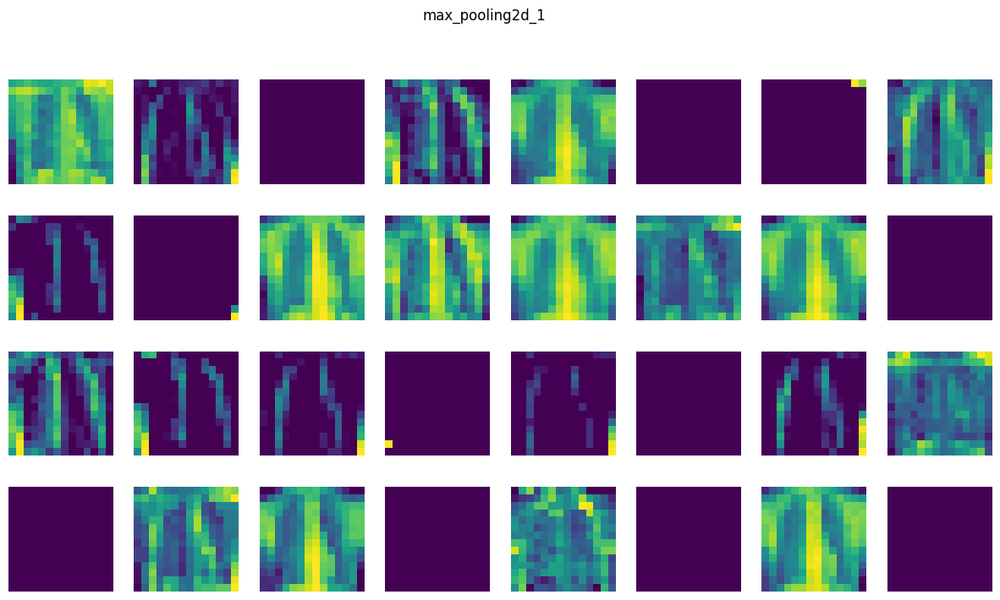

In [ ]:
plot_conv_layer_result(normal_activations,3)

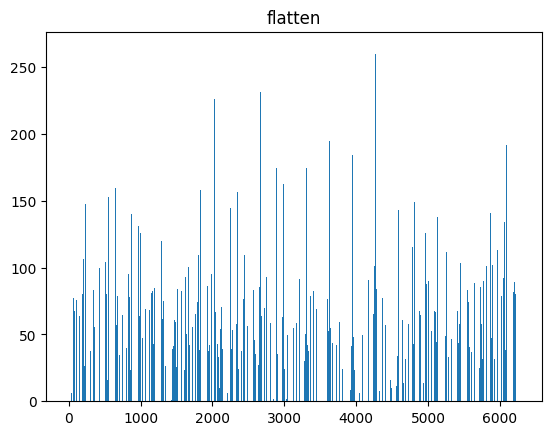

In [ ]:
plot_1d_layer_result(normal_activations,4)

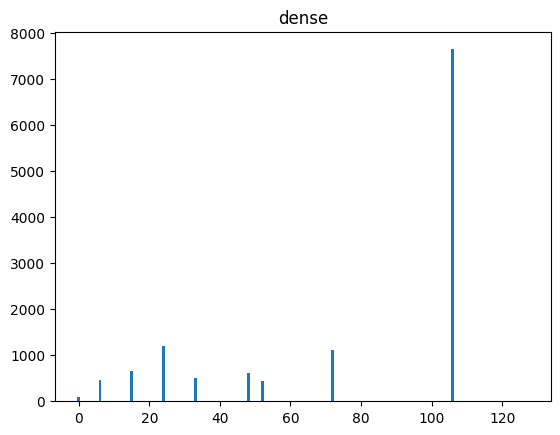

In [ ]:
plot_1d_layer_result(normal_activations,5)

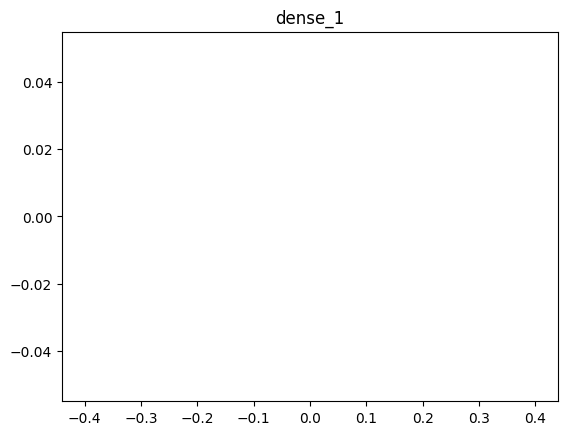

In [ ]:
plot_1d_layer_result(normal_activations,6)

##visualize convolutional kernels

(3, 3, 1, 32)


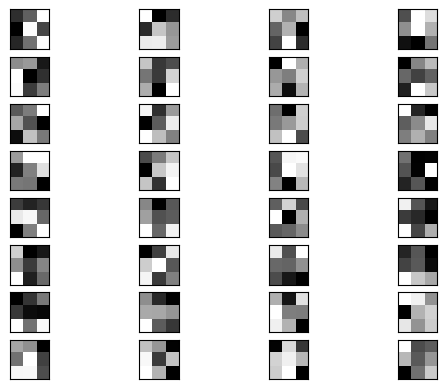

In [ ]:
from matplotlib import pyplot
# load the model
model = cnn
# retrieve weights from the first conv layer
filters, biases = model.layers[0].get_weights()
# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)
# plot first few filters
n_filters, ix = 32, 1
print(filters.shape)

for i in range(n_filters):
  # get the filter
  f = filters[:, :, 0, i]
  ax = pyplot.subplot(8, 4, ix)
  ax.set_xticks([])
  ax.set_yticks([])
  # plot filter channel in grayscale
  pyplot.imshow(f, cmap='gray')
  ix += 1
# show the figure
pyplot.show()